In [1]:
import analyze
import os
import pandas as pd
import numpy as np
import warnings
import soundfile as sf
from IPython.utils import io
import librosa
import librosa.display
import matplotlib.pyplot as plt

sec = 20 # the length of the spectrogram to show at once in manual processing

def show(sig, n_fft = 2048, hop_length = 512, n_mels = 128, sr = 32000, title = '', sec=sec):
    spec = librosa.feature.melspectrogram(y=sig, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels = n_mels)
    spec = librosa.power_to_db(spec, ref = np.max)
    fig, ax = plt.subplots(figsize = (14,4))
    img = librosa.display.specshow(spec, x_axis='time', y_axis='mel', sr=sr, ax=ax, n_fft=n_fft, hop_length = hop_length, fmax = sr/2)
    ax.set_xticks(np.arange(0, sec+1, 1))
    ax.set_title(title)
    plt.grid(linewidth=2, axis='x', color='white')
    plt.show()

# Get the list of species to be analyzed

In [2]:
batch_no = '_16' # running batch number

results_path_out = 'BirdNet_results/all_birdnet_results_batch' + batch_no + '.csv'

In [4]:
path_to_species = 'models/Argentina_Chaco/species_list.csv' 

old_bn_results = pd.read_csv('BirdNet_results/all_birdnet_results.csv')
species_list = pd.read_csv(path_to_species)

new_species = list(set(species_list['species_code']) - set(old_bn_results['species_code']))
print(f"{len(new_species)} new species:")
print(new_species)

birdnet_species = pd.read_csv('BirdNET-Analyzer-main/checkpoints/V2.4/BirdNET_GLOBAL_6K_V2.4_Labels.txt', sep = "_", header = None, names = ['scientific_name', 'common_name'])

C:\Users\plauha\AppData\Local\Temp\ipykernel_17756\2460089524.py:3: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  old_bn_results = pd.read_csv('BirdNet_results/all_birdnet_results.csv')


4 new species:
['casfin1', 'salmon1', 'bkcmon1', 'spetyr1']


In [5]:
# Check if some species are not recognized by BirdNET and should be manually processed
print("Checking for species missing from Birdnet labels...")
new_species_bn = []
new_species_xc = []
sp_codes = []
missing_codes = []
for sp in new_species:
    sp_code = sp
    name_c = species_list['common_name'].loc[species_list['species_code']==sp].iloc[0]
    name_sci = species_list['scientific_name'].loc[species_list['species_code']==sp].iloc[0]
    name_c_xc = species_list['xc_common_name'].loc[species_list['species_code']==sp].iloc[0]
    name_sci_xc = species_list['xc_scientific_name'].loc[species_list['species_code']==sp].iloc[0]
    name_birdnet = ""
    #print(f"{sp}, {sp_code}, {name_c}, {name_sci}, {name_c_xc}, {name_sci_xc}")
    if(len(birdnet_species.loc[birdnet_species['common_name']== name_c])==1):
        name_birdnet = name_c
    elif(len(birdnet_species.loc[birdnet_species['common_name']== name_c_xc])==1):
        name_birdnet = name_c_xc
    elif(len(birdnet_species.loc[birdnet_species['scientific_name']== name_sci])==1):
        name_birdnet = birdnet_species['common_name'].loc[birdnet_species['scientific_name']== name_sci].iloc[0]
    elif(len(birdnet_species.loc[birdnet_species['scientific_name']== name_sci_xc])==1):
        name_birdnet = birdnet_species['common_name'].loc[birdnet_species['scientific_name']== name_sci_xc].iloc[0]
    if name_birdnet == "":
        print(f"{sp} not found from BirdNet labels!")
        missing_codes.append(sp)
    else:
        new_species_bn.append(name_birdnet)
        new_species_xc.append(name_sci_xc)
        sp_codes.append(sp)
print("Complete!")
print(f"{len(missing_codes)} species to process manually")

species_to_process = pd.DataFrame({'sp_code': sp_codes, 'xc_scientific_name': new_species_xc, 'name_birdnet': new_species_bn})
species_to_process

Checking for species missing from Birdnet labels...
casfin1 not found from BirdNet labels!
salmon1 not found from BirdNet labels!
bkcmon1 not found from BirdNet labels!
Complete!
3 species to process manually


,sp_code,xc_scientific_name,name_birdnet
0,spetyr1,Hymenops perspicillatus,Spectacled Tyrant


# Run BirdNet-Analyzer to detect vocalizations

In [6]:
path_to_metadata = '---/' # path where metadata of xeno-canto recordings is saved
path_to_recs = '---/' # path where xeno-canto recordings have been saved

# Read csv if continuing an interrupted session or initialize new data if beginning a new session
#final_results = pd.read_csv(results_path_out)
final_results = None
j = 0 # index to continue from

prev_species = ""

# Read xeno-canto metadata and select the files to analyze
metadata = pd.read_csv(path_to_metadata + "xc_downloaded_files.csv")
metadata['species'] = metadata['gen'] + ' ' + metadata['sp']
metadata=metadata.loc[metadata['species'].isin(species_to_process['xc_scientific_name'])]
metadata=metadata.sort_values('species')
metadata=metadata.reset_index(drop=True)

for i in range(j, len(metadata)):
    sp = metadata['species'].iloc[i] 
    if (sp != prev_species):
        if(prev_species != ""):
            final_results.to_csv(results_path_out, index = False)
        prev_species = sp
        name_birdnet = species_to_process['name_birdnet'].loc[species_to_process['xc_scientific_name'] == sp].iloc[0]
        sp_code = species_list['species_code'].loc[species_list['xc_scientific_name'] == sp].iloc[0]
        print(f"Processing: {name_birdnet}, {sp}, ({sp_code})")
        print(f"Index: i = {i} / {len(metadata)}")
        
    dur = metadata.loc[i, 'length']
    dur = sum(x * int(t) for x, t in zip([60, 1], dur.split(":")))
    rec_id = str(metadata['id'].iloc[i])
    path_in = path_to_recs + rec_id + '.mp3'
    path_out = 'BirdNet_results/results/' + rec_id + '.csv'
    with io.capture_output() as captured:
        %run BirdNET-Analyzer-main/analyze.py --i {path_in} --o {path_out} --overlap 0.5 --sensitivity 1.5 --min_conf 0.30
    # Process birdnet outputs and save all results
    if os.path.isfile(path_out):
        result = pd.read_csv(path_out, sep = "\t")
        result = result.loc[result['End Time (s)'] < dur]
        result = result.loc[result['Common Name'] == name_birdnet]
        result['species_code'] = sp_code
        result['file'] = rec_id
        final_results = pd.concat([final_results, result])
final_results.to_csv(results_path_out, index = False)

C:\Users\plauha\AppData\Local\Temp\ipykernel_17756\3953540178.py:9: DtypeWarning: Columns (0,8) have mixed types. Specify dtype option on import or set low_memory=False.
  metadata = pd.read_csv("L:/bytdk_lifeplan/patrik/Birdsound_library/Audio/xc_downloaded_files.csv")


Processing: Spectacled Tyrant, Hymenops perspicillatus, (spetyr1)
Index: i = 0 / 28


# Manual processing for species BirdNET doesn't recognize 

In [19]:
# Read xeno-canto metadata and select the files to analyze
manual_check_sps = species_list.loc[species_list['species_code'].isin(missing_codes)]
metadata = pd.read_csv(path_to_metadata + "xc_downloaded_files.csv")
metadata['species'] = metadata['gen'] + ' ' + metadata['sp']
metadata = metadata.loc[metadata['species'].isin(manual_check_sps['xc_scientific_name'])]
print(f"{len(metadata)} files from {len(np.unique(metadata['species']))} species to process")

28 files from 1 species to process


Finished processing 
Total files processed: 0/28


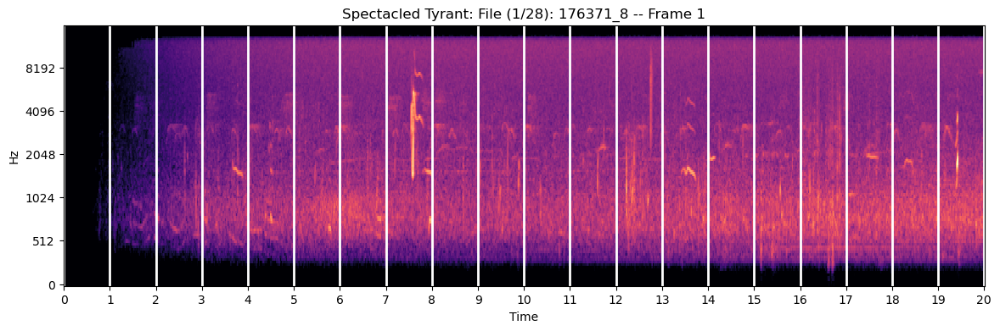

Give center of next frame (n=next, q=quit)


 7.5


Give center of next frame (n=next, q=quit)


 n


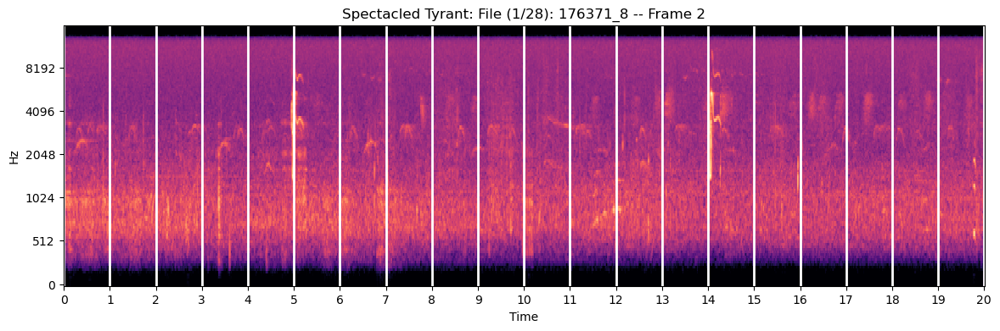

Give center of next frame (n=next, q=quit)


 5


Give center of next frame (n=next, q=quit)


 14


Give center of next frame (n=next, q=quit)


 n


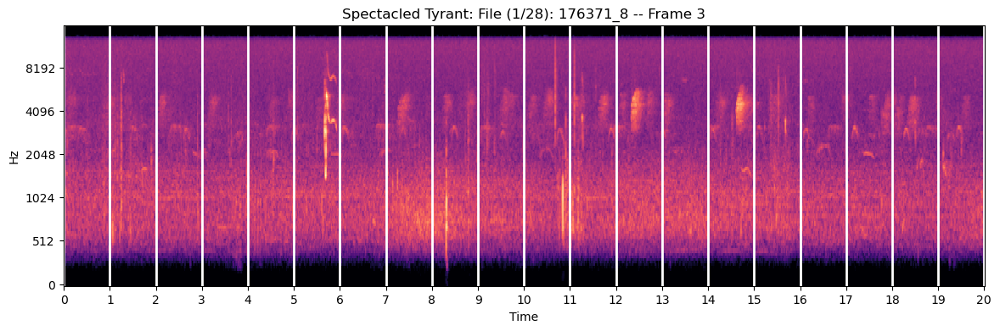

Give center of next frame (n=next, q=quit)


 5.5


Give center of next frame (n=next, q=quit)


 n


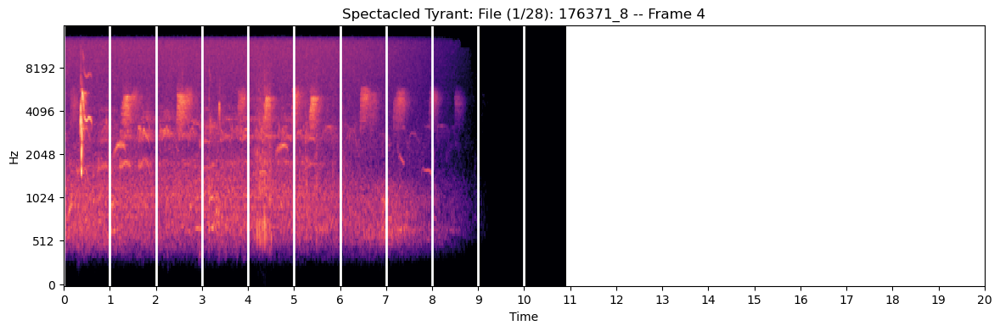

Give center of next frame (n=next, q=quit)


 0.5


Give center of next frame (n=next, q=quit)


 n


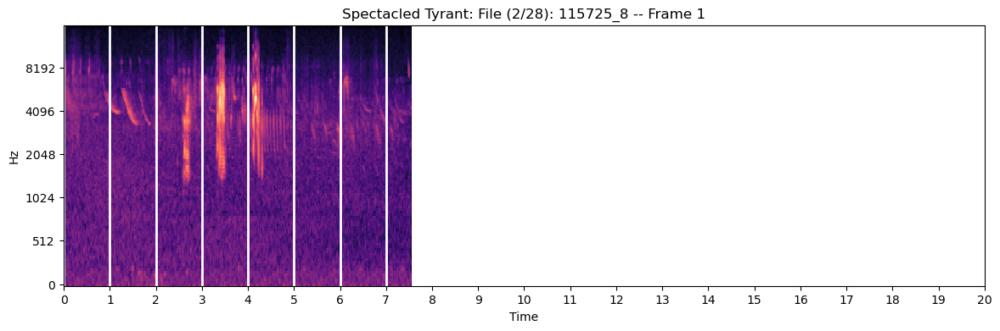

Give center of next frame (n=next, q=quit)


 3.5


Give center of next frame (n=next, q=quit)


 n


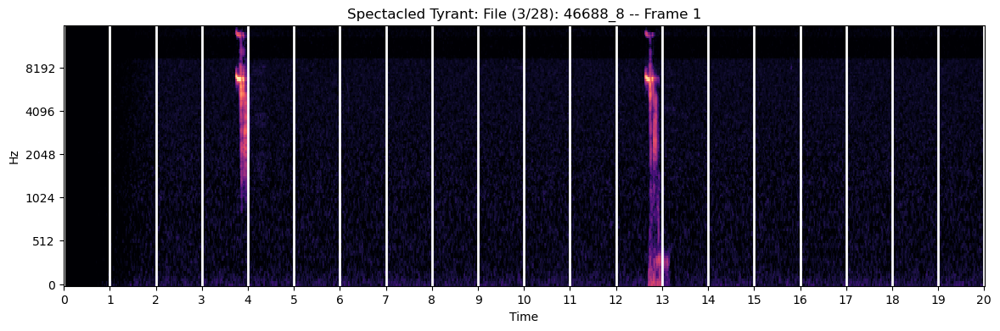

Give center of next frame (n=next, q=quit)


 4


Give center of next frame (n=next, q=quit)


 13


Give center of next frame (n=next, q=quit)


 n


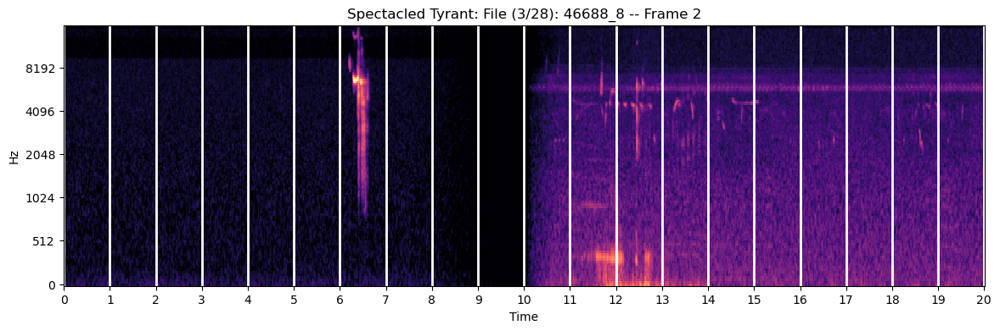

Give center of next frame (n=next, q=quit)


 6.5


Give center of next frame (n=next, q=quit)


 n


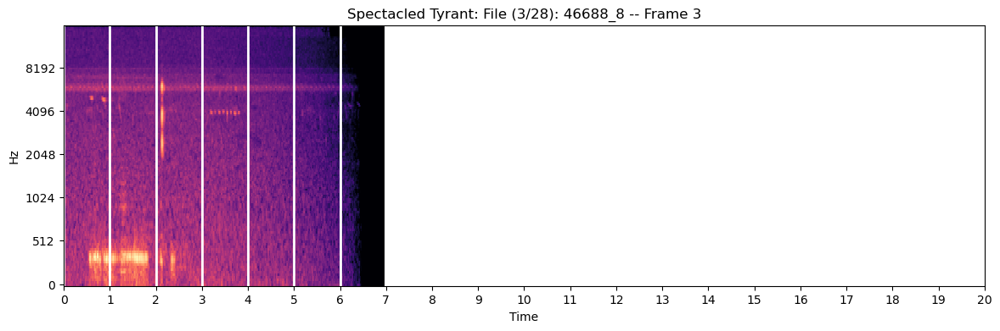

Give center of next frame (n=next, q=quit)


 n


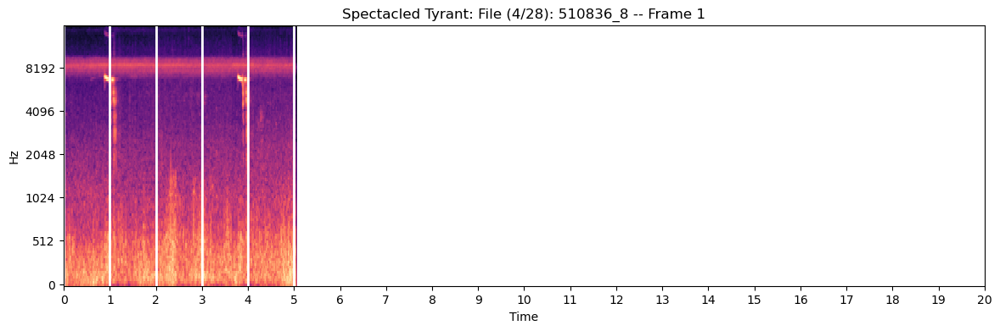

Give center of next frame (n=next, q=quit)


 1.5


Give center of next frame (n=next, q=quit)


 3.5


Give center of next frame (n=next, q=quit)


 n


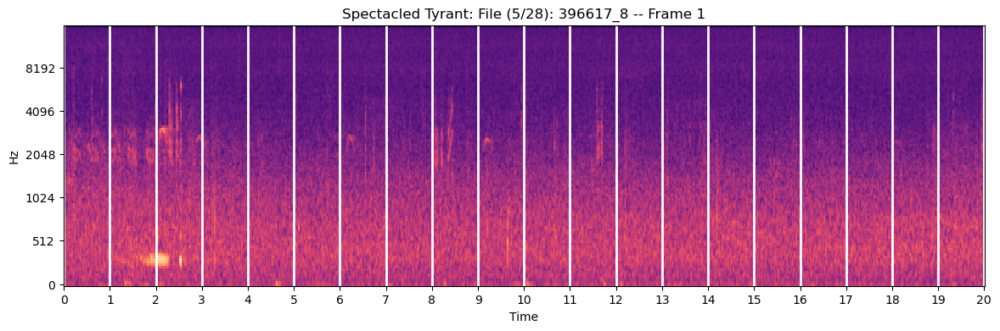

Give center of next frame (n=next, q=quit)


 2.5


Give center of next frame (n=next, q=quit)


 8


Give center of next frame (n=next, q=quit)


 12


Give center of next frame (n=next, q=quit)


 n


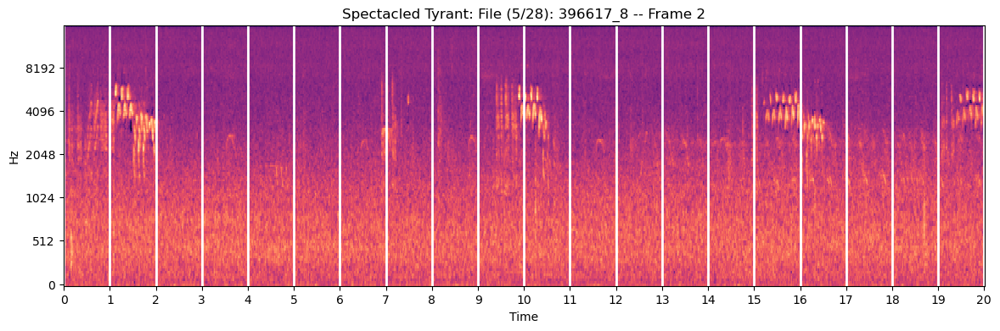

Give center of next frame (n=next, q=quit)


 1.5


Give center of next frame (n=next, q=quit)


 10


Give center of next frame (n=next, q=quit)


 16


Give center of next frame (n=next, q=quit)


 n


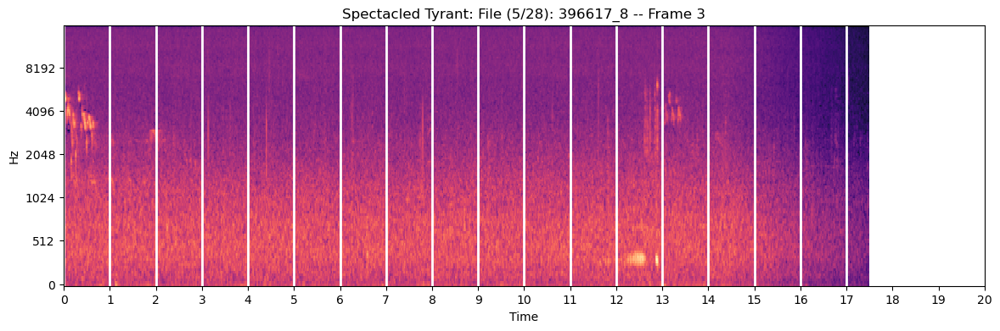

Give center of next frame (n=next, q=quit)


 0


Give center of next frame (n=next, q=quit)


 13


Give center of next frame (n=next, q=quit)


 n


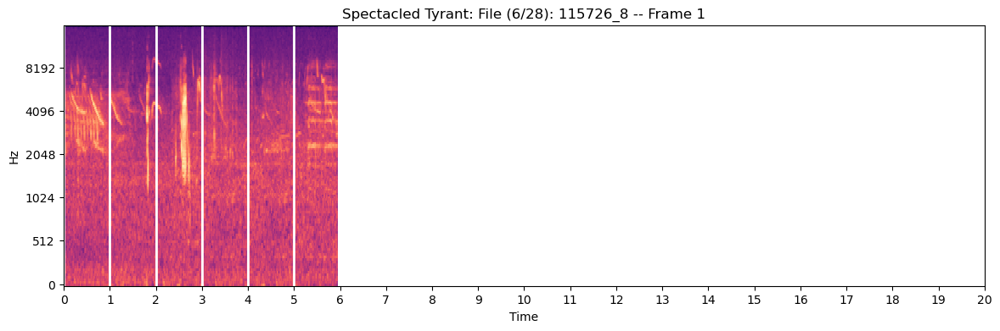

Give center of next frame (n=next, q=quit)


 2.5


Give center of next frame (n=next, q=quit)


 n


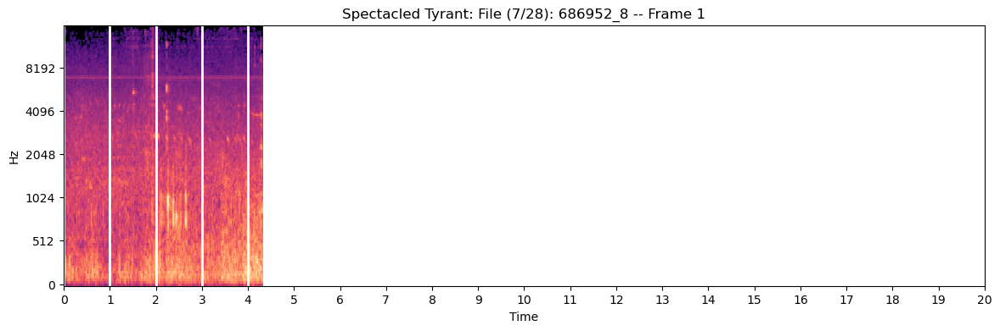

Give center of next frame (n=next, q=quit)


 2


Give center of next frame (n=next, q=quit)


 n


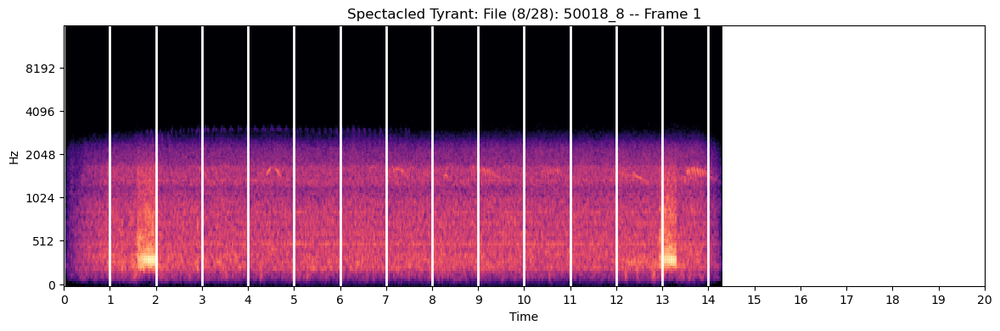

Give center of next frame (n=next, q=quit)


 n


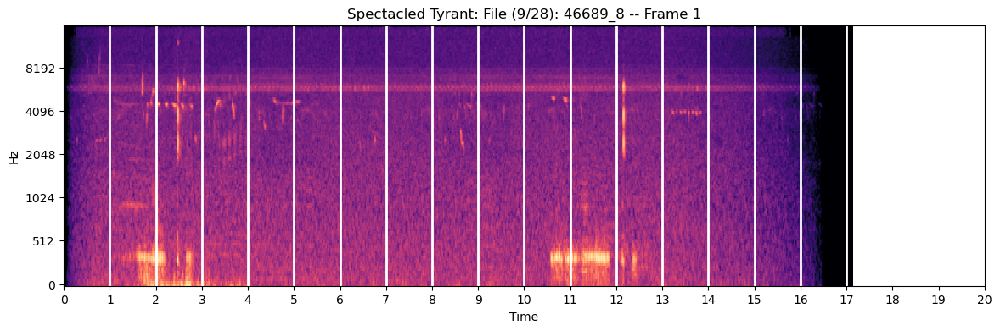

Give center of next frame (n=next, q=quit)


 n


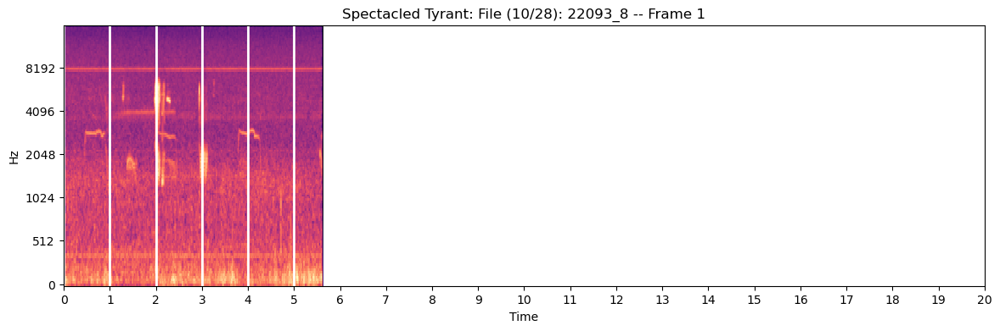

Give center of next frame (n=next, q=quit)


 2


Give center of next frame (n=next, q=quit)


 n


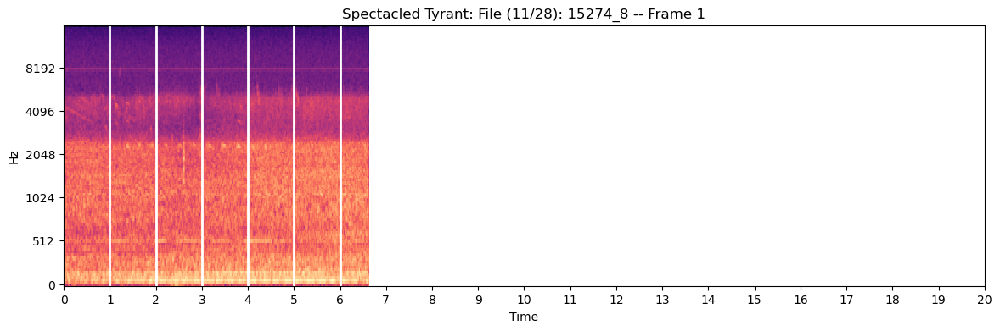

Give center of next frame (n=next, q=quit)


 2.5


Give center of next frame (n=next, q=quit)


 n


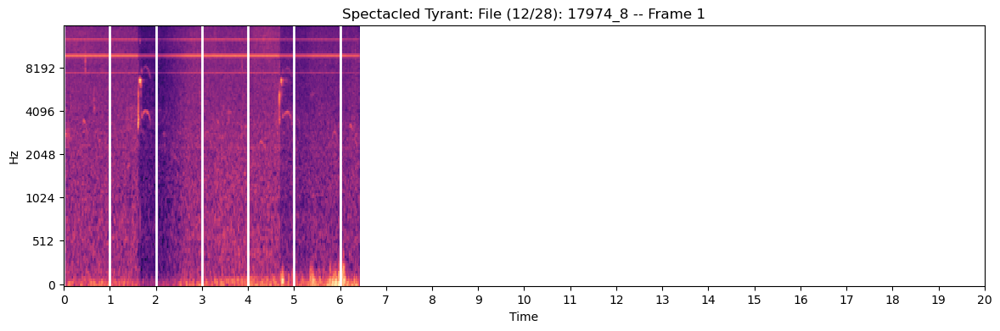

Give center of next frame (n=next, q=quit)


 2


Give center of next frame (n=next, q=quit)


 4.5


Give center of next frame (n=next, q=quit)


 n


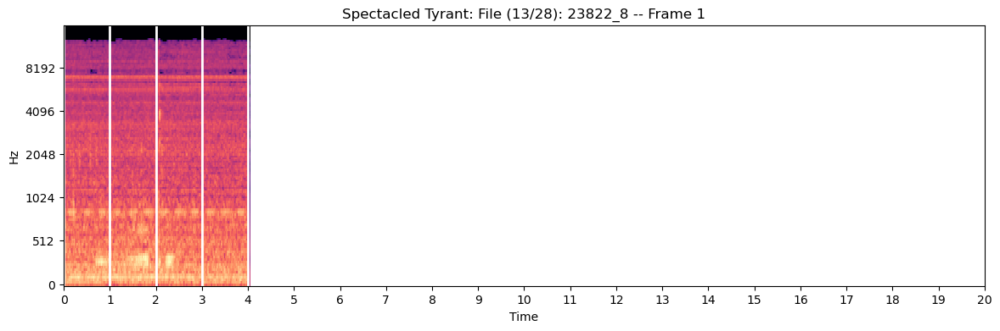

Give center of next frame (n=next, q=quit)


 2


Give center of next frame (n=next, q=quit)


 n


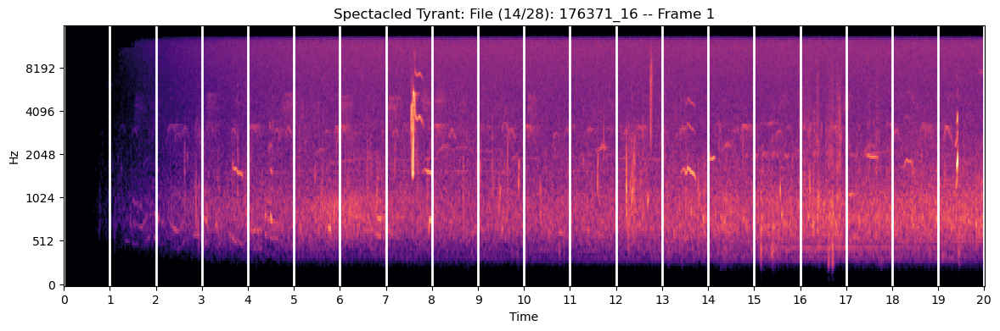

Give center of next frame (n=next, q=quit)


 7.5


Give center of next frame (n=next, q=quit)


 n


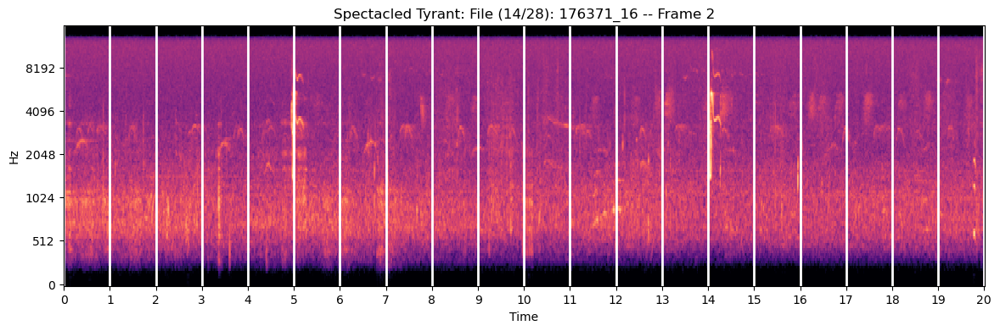

Give center of next frame (n=next, q=quit)


 5


Give center of next frame (n=next, q=quit)


 14


Give center of next frame (n=next, q=quit)


 n


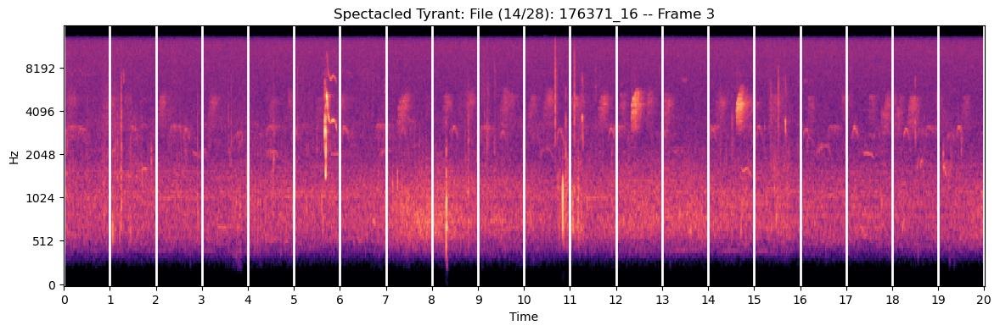

Give center of next frame (n=next, q=quit)


 6


Give center of next frame (n=next, q=quit)


 n


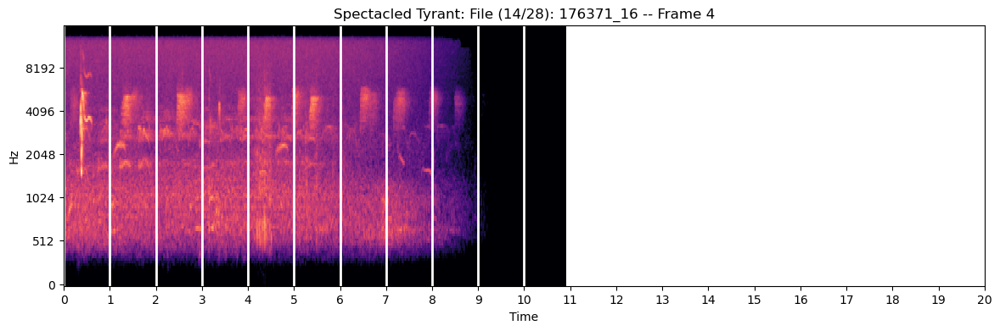

Give center of next frame (n=next, q=quit)


 0.5


Give center of next frame (n=next, q=quit)


 n


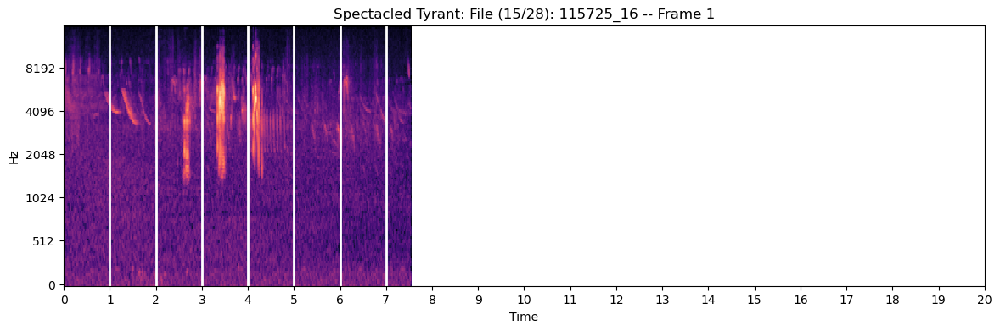

Give center of next frame (n=next, q=quit)


 3.5


Give center of next frame (n=next, q=quit)


 n


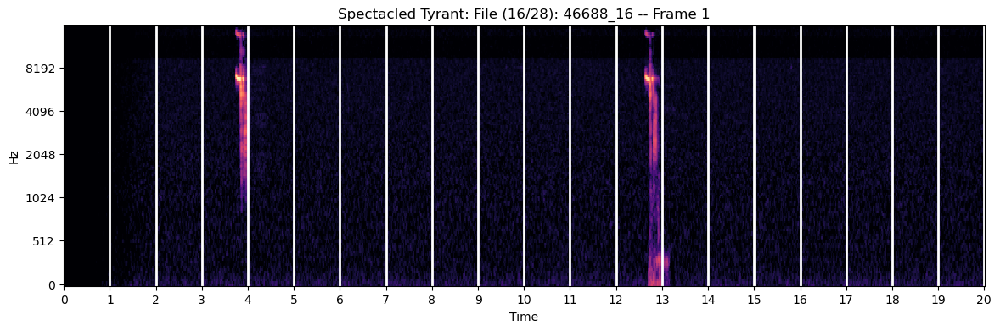

Give center of next frame (n=next, q=quit)


 4


Give center of next frame (n=next, q=quit)


 13


Give center of next frame (n=next, q=quit)


 n


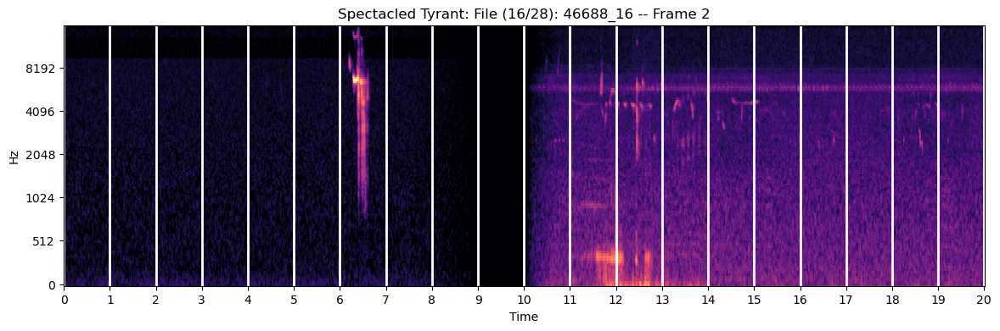

Give center of next frame (n=next, q=quit)


 6.5


Give center of next frame (n=next, q=quit)


 n


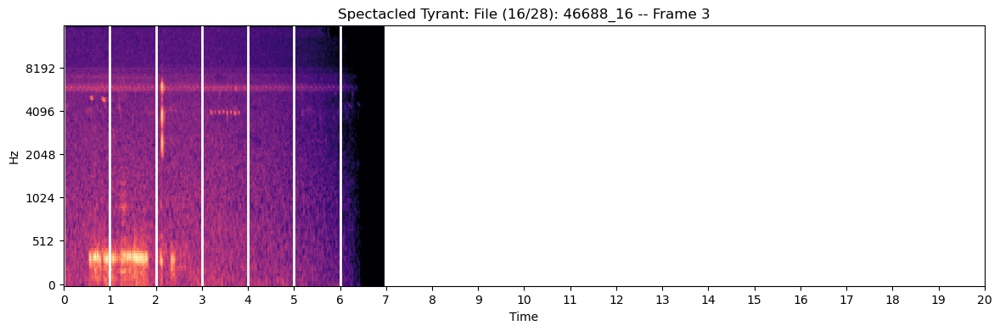

Give center of next frame (n=next, q=quit)


 n


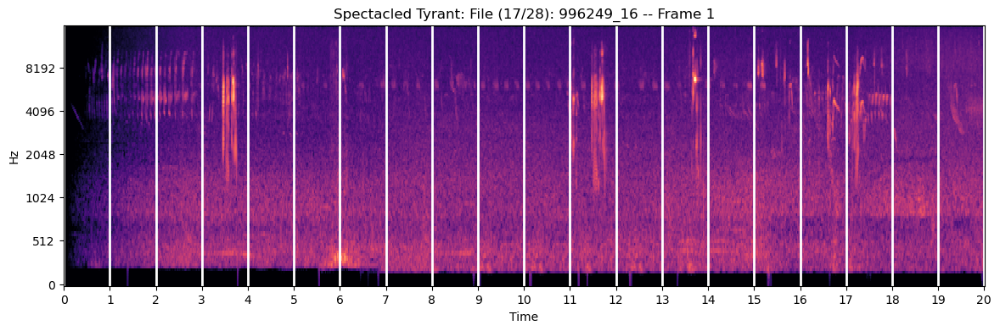

Give center of next frame (n=next, q=quit)


 3.5


Give center of next frame (n=next, q=quit)


 11.5


Give center of next frame (n=next, q=quit)


 17


Give center of next frame (n=next, q=quit)


 n


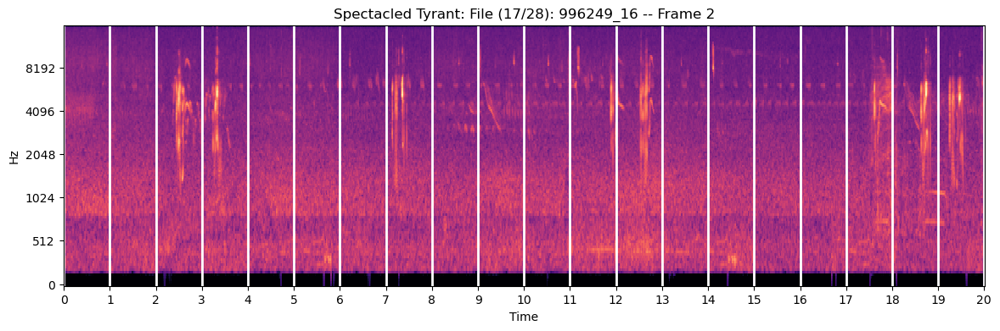

Give center of next frame (n=next, q=quit)


 3


Give center of next frame (n=next, q=quit)


 7


Give center of next frame (n=next, q=quit)


 13


Give center of next frame (n=next, q=quit)


 18.5


Give center of next frame (n=next, q=quit)


 n


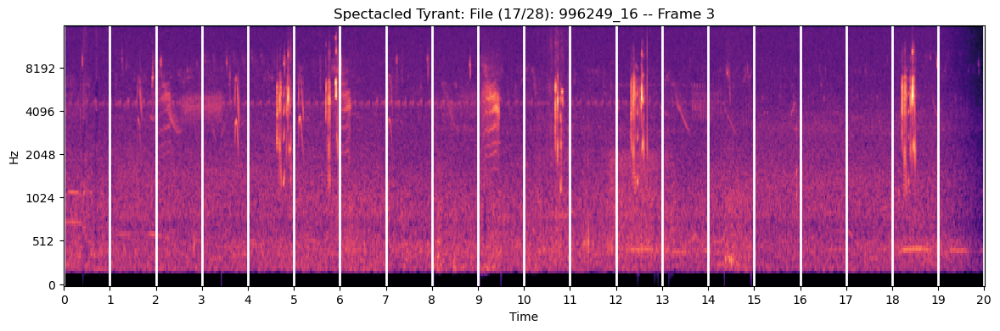

Give center of next frame (n=next, q=quit)


 5


Give center of next frame (n=next, q=quit)


 11.5


Give center of next frame (n=next, q=quit)


 18.5


Give center of next frame (n=next, q=quit)


 n


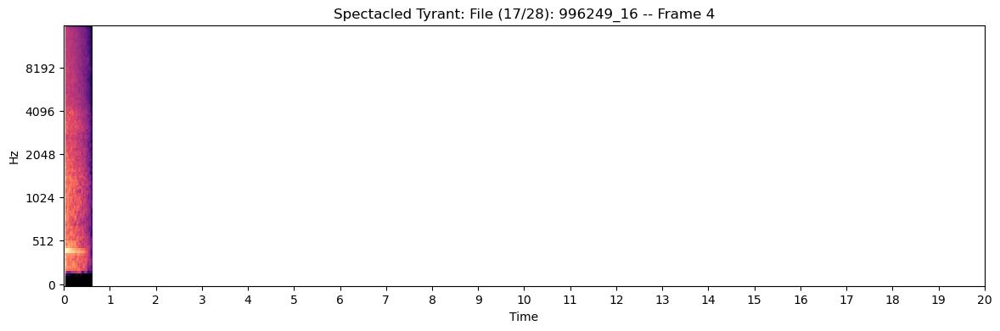

Give center of next frame (n=next, q=quit)


 n


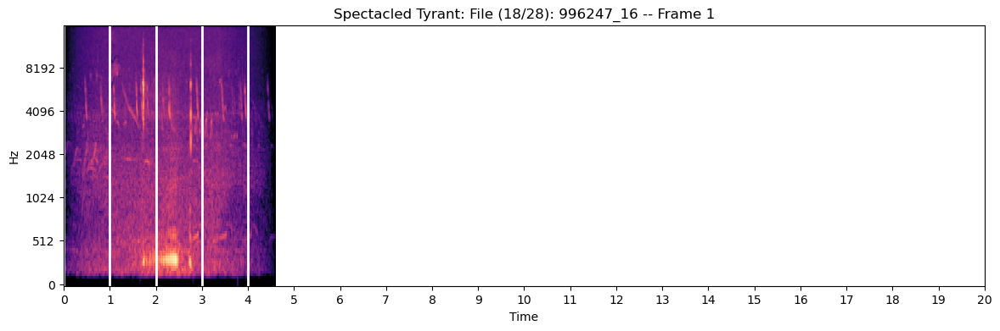

Give center of next frame (n=next, q=quit)


 2


Give center of next frame (n=next, q=quit)


 n


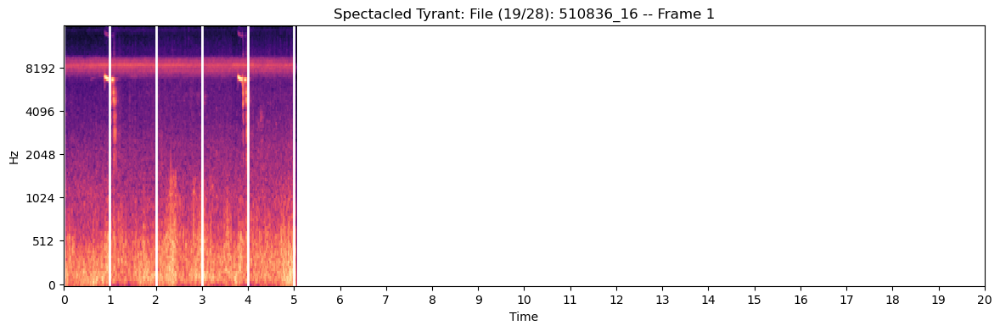

Give center of next frame (n=next, q=quit)


 2.3


Give center of next frame (n=next, q=quit)


 n


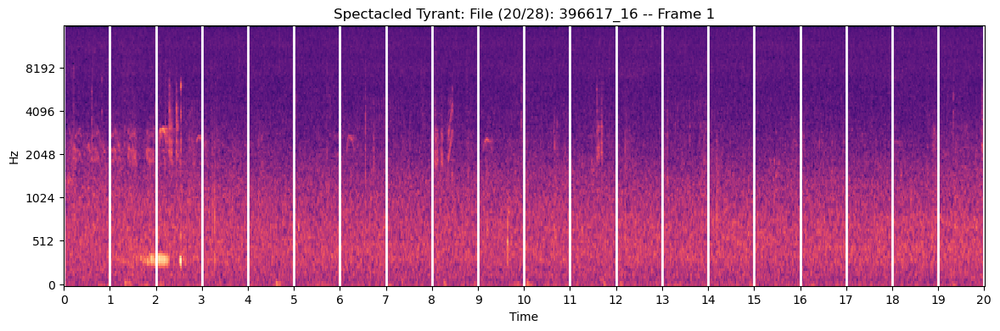

Give center of next frame (n=next, q=quit)


 2.5


Give center of next frame (n=next, q=quit)


 8.5


Give center of next frame (n=next, q=quit)


 n


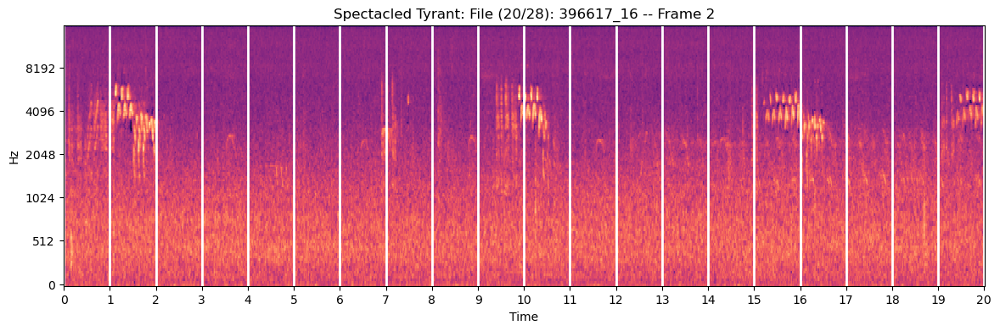

Give center of next frame (n=next, q=quit)


 1.5


Give center of next frame (n=next, q=quit)


 10


Give center of next frame (n=next, q=quit)


 16


Give center of next frame (n=next, q=quit)


 n


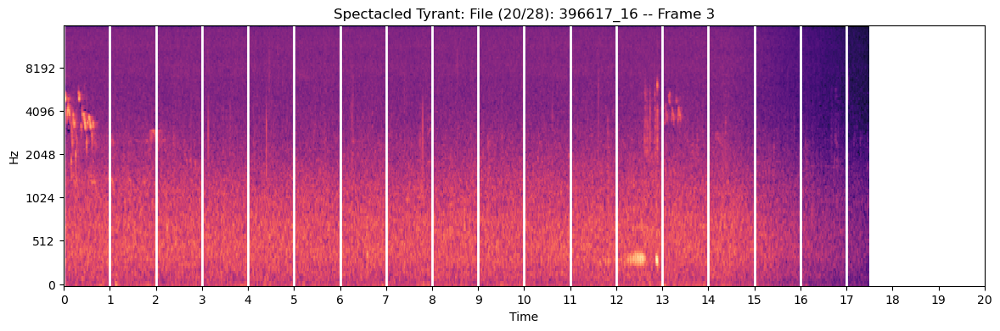

Give center of next frame (n=next, q=quit)


 0


Give center of next frame (n=next, q=quit)


 13


Give center of next frame (n=next, q=quit)


 n


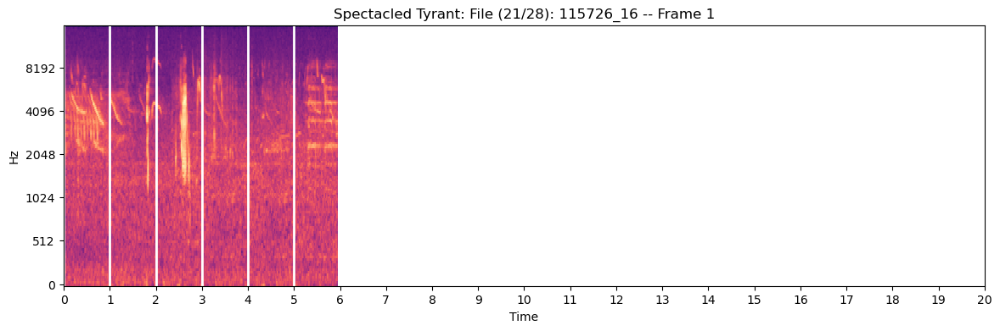

Give center of next frame (n=next, q=quit)


 2.5


Give center of next frame (n=next, q=quit)


 n


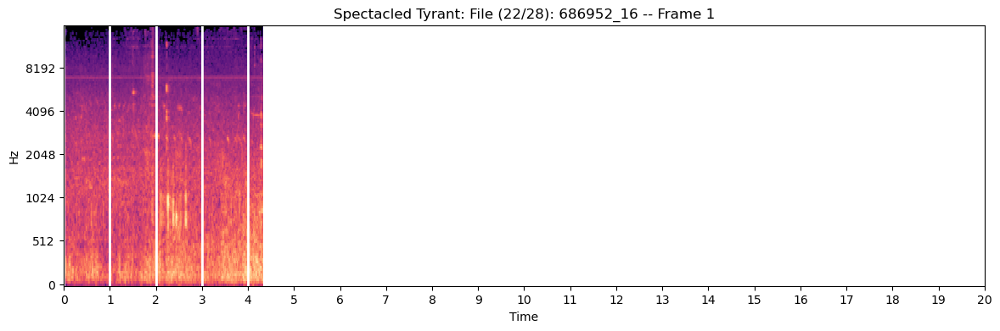

Give center of next frame (n=next, q=quit)


 n


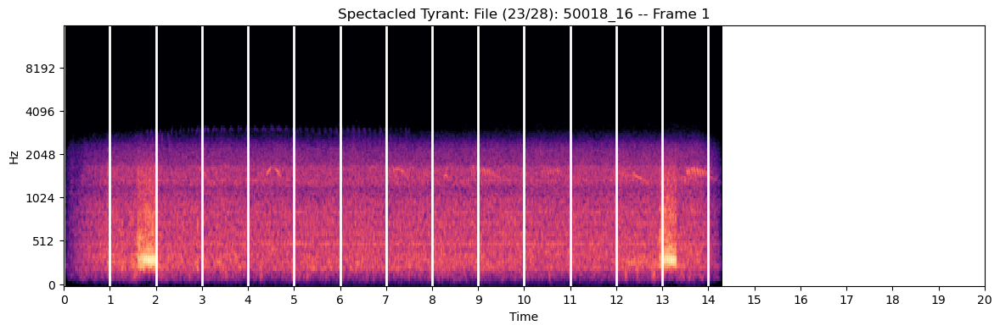

Give center of next frame (n=next, q=quit)


 n


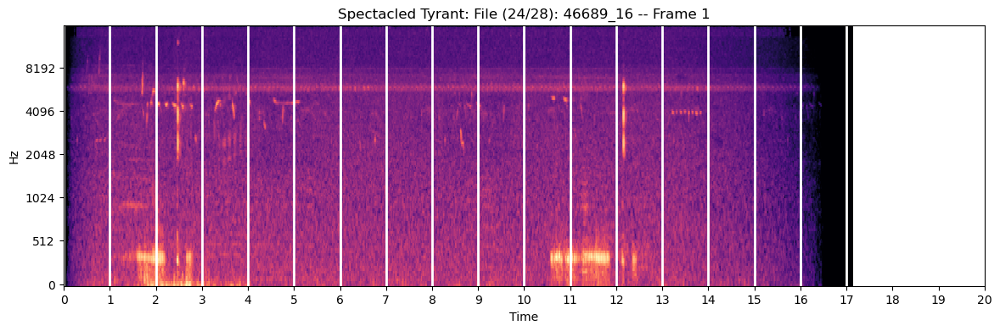

Give center of next frame (n=next, q=quit)


 n


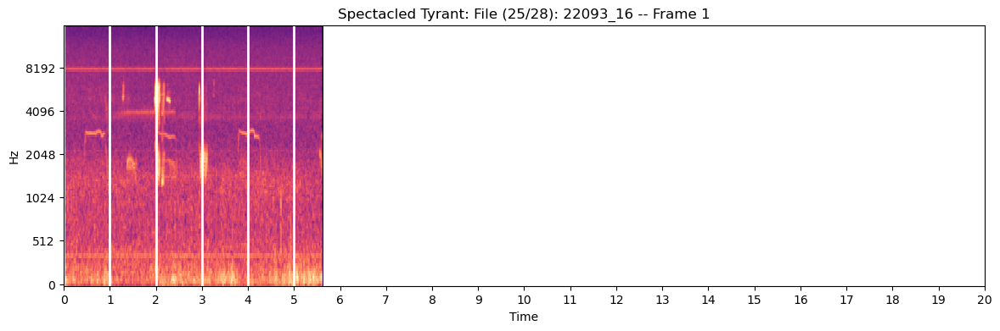

Give center of next frame (n=next, q=quit)


 2


Give center of next frame (n=next, q=quit)


 n


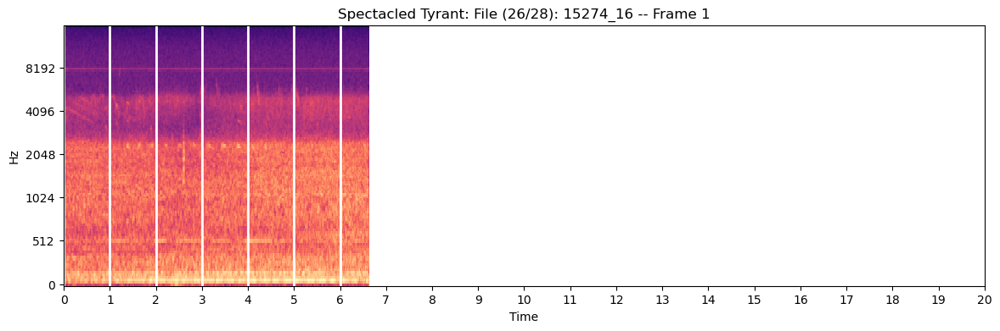

Give center of next frame (n=next, q=quit)


 2.5


Give center of next frame (n=next, q=quit)


 n


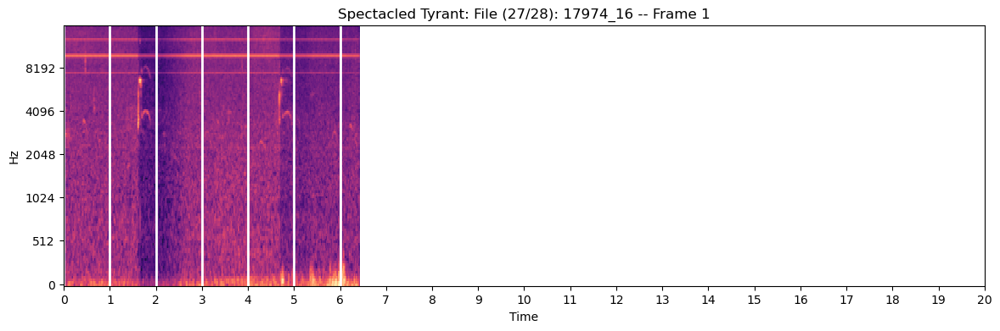

Give center of next frame (n=next, q=quit)


 1.5


Give center of next frame (n=next, q=quit)


 4.5


Give center of next frame (n=next, q=quit)


 n


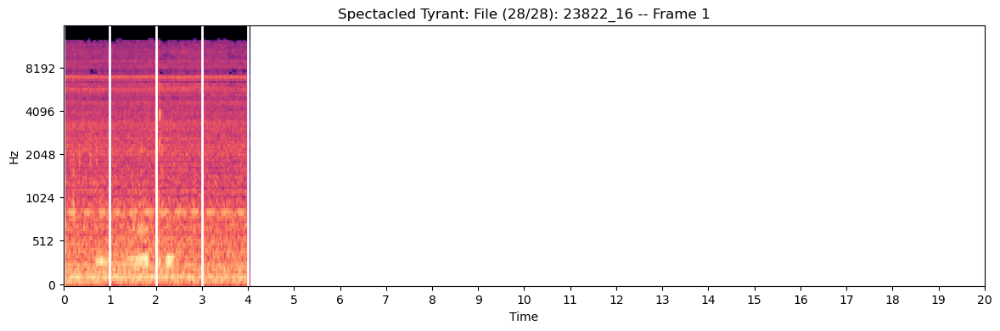

Give center of next frame (n=next, q=quit)


 n


,Start (s),End (s),Scientific name,Common name,Confidence,species_code,file
0,0.0,3.0,Xolmis coronatus,Black-crowned Monjita,1,bkcmon1,965892_16
1,15.8,18.8,Xolmis coronatus,Black-crowned Monjita,1,bkcmon1,965892_16
2,0.0,3.0,Xolmis coronatus,Black-crowned Monjita,1,bkcmon1,946740_16
3,2.5,5.5,Xolmis coronatus,Black-crowned Monjita,1,bkcmon1,946740_16
4,5.5,8.5,Xolmis coronatus,Black-crowned Monjita,1,bkcmon1,946740_16
...,...,...,...,...,...,...,...
54,1.0,4.0,Hymenops perspicillatus,Spectacled Tyrant,1,spetyr1,115726_16
55,0.5,3.5,Hymenops perspicillatus,Spectacled Tyrant,1,spetyr1,22093_16
56,1.0,4.0,Hymenops perspicillatus,Spectacled Tyrant,1,spetyr1,15274_16
57,0.0,3.0,Hymenops perspicillatus,Spectacled Tyrant,1,spetyr1,17974_16


In [20]:
# Start a new session or continue an interrupted session from the previous index
j=0
if j == 0:
    manual_results = pd.DataFrame()
else:
    manual_results = pd.read_csv('BirdNet_results/manual_framing_temp.csv')

timepoints = []
filenames = []
sc_names = []
c_names = []
sp_codes = []
prev_sp = ""

for i in range(j, len(metadata)):
    f = metadata['id'].iloc[i]
    sp_sci = manual_check_sps['scientific_name'].loc[manual_check_sps['xc_scientific_name'] == metadata['species'].iloc[i]].iloc[0]
    sp_c = manual_check_sps['common_name'].loc[manual_check_sps['xc_scientific_name'] == metadata['species'].iloc[i]].iloc[0]
    sp_code = manual_check_sps['species_code'].loc[manual_check_sps['xc_scientific_name'] == metadata['species'].iloc[i]].iloc[0]
    y, sr = librosa.load(path_to_recs + f + '.mp3', sr=32000)
    if prev_sp != sp_code:
        print(f"Finished processing {prev_sp}")
        prev_sp = sp_code
        count_sp = 0
        print(f"Total files processed: {i}/{len(metadata)}")
    count_sp = count_sp +1
    
    st_i=0
    frame = 0
    while st_i < len(y):
        show(y[st_i:min(st_i+sec*sr,len(y))], title=(f"{sp_c}: File ({count_sp}/{len(metadata.loc[metadata['species']== metadata['species'].iloc[i]])}): {f} -- Frame {str(frame+1)}"), sec=sec)
        while(True):
            print("Give center of next frame (n=next, q=quit)")
            input_ = input()
            if input_ =='n':
                break
            elif input_ == 'q':
                df = pd.DataFrame({'file':filenames, 'start':timepoints})
                break
            else:
                timepoints.append(frame*sec + float(input_)-1.5)
                filenames.append(f)
                sc_names.append(sp_sci)
                c_names.append(sp_c)
                sp_codes.append(sp_code)
        st_i = st_i+sec*sr
        frame = frame+1
        if input_ == 'q':
            print(f"Last index processed: {i-1}")
            break
    if input_ == 'q':
        break
manual_results = pd.concat([manual_results , pd.DataFrame({'Start (s)':timepoints,'End (s)':[t+3 for t in timepoints],'Scientific name':sc_names, 
                                             'Common name':c_names, 'Confidence':1,'species_code':sp_codes,'file':filenames})])   
manual_results.to_csv('BirdNet_results/manual_framing_temp.csv', index=False)
manual_results

In [1]:
# save results of an interrupted session
#manual_results = pd.concat([manual_results , pd.DataFrame({'Start (s)':timepoints,'End (s)':[t+3 for t in timepoints],'Scientific name':sc_names, 
#                                             'Common name':c_names, 'Confidence':1,'species_code':sp_codes,'file':filenames})])   
#manual_results.to_csv('BirdNet_results/manual_framing_temp.csv', index=False)
#print(i)
#manual_results

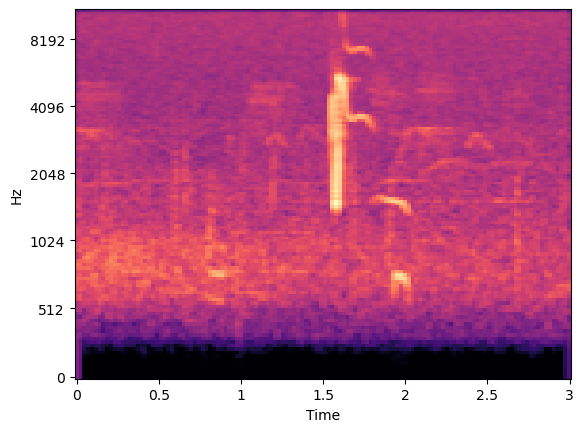

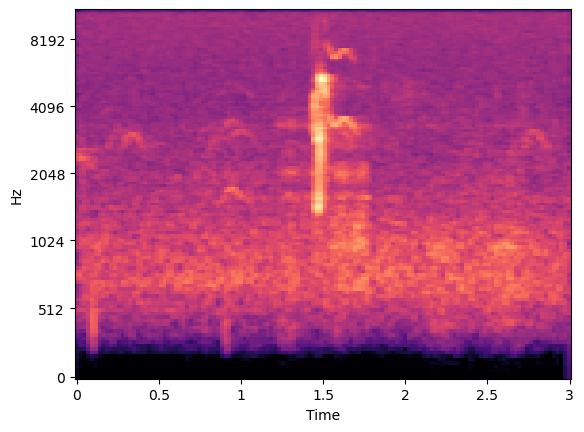

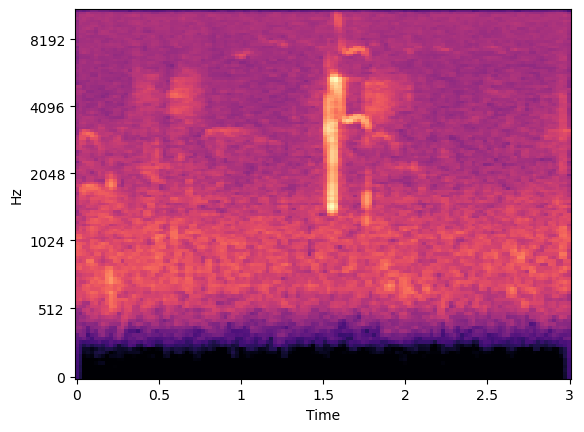

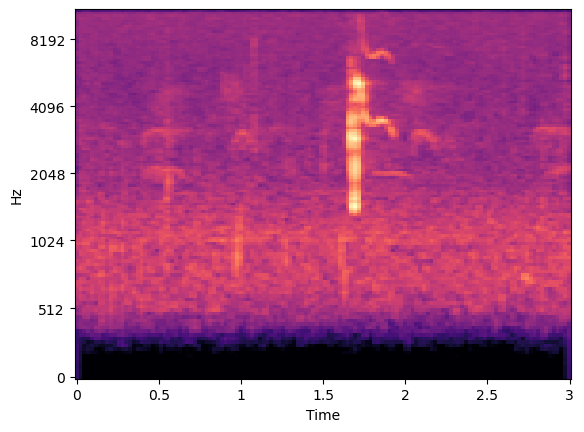

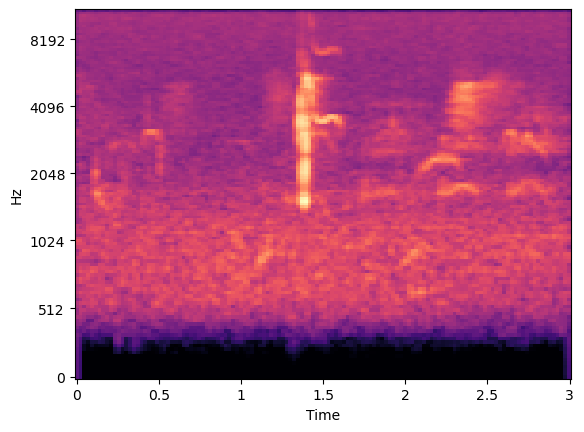

...

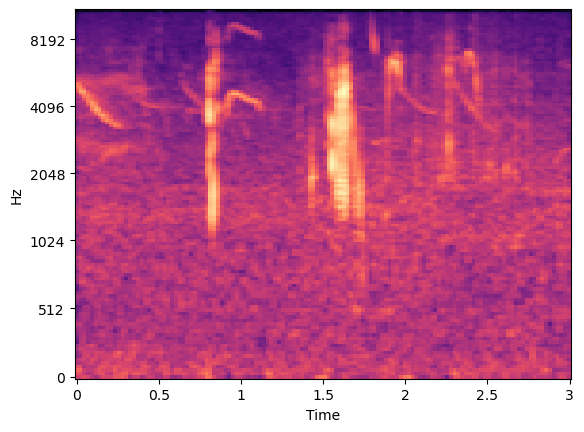

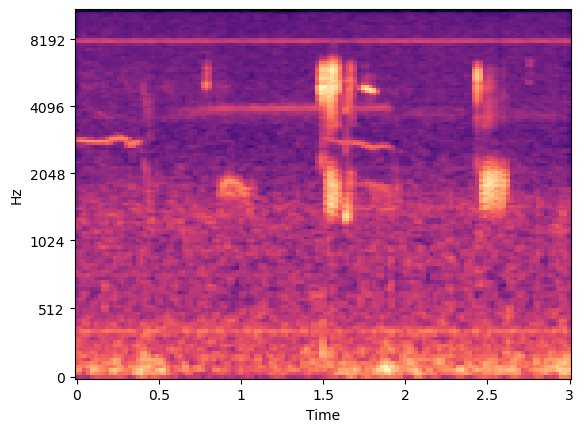

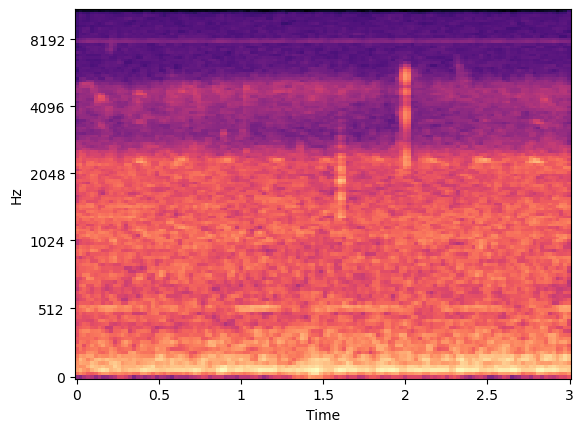

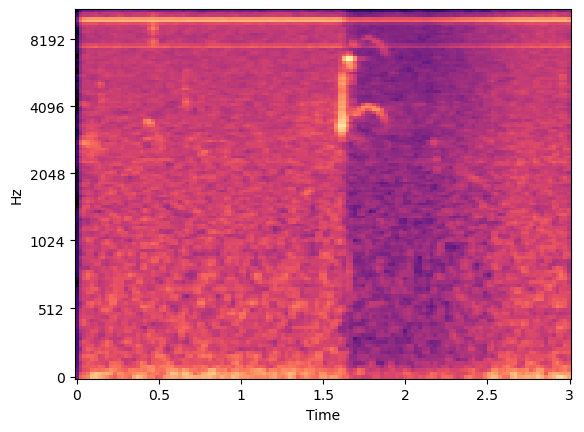

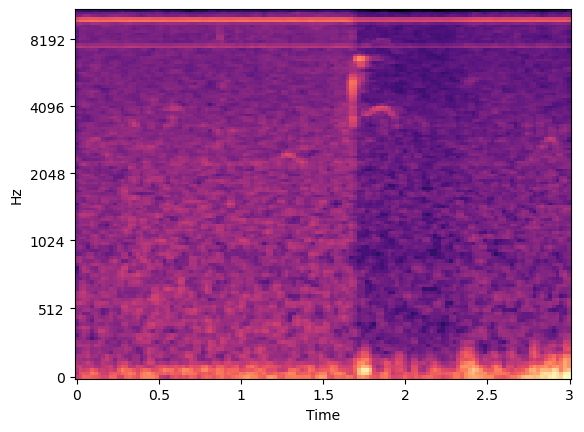

In [21]:
# Check manual selections for a given species
target_scientific_name = 'Hymenops perspicillatus'
results = pd.read_csv('BirdNet_results/manual_framing_temp.csv')
results=results.loc[results['Scientific name']==target_scientific_name]
for i in range(len(results)):
    f = results['file'].iloc[i]
    s = results['Start (s)'].iloc[i]
    y, sr = librosa.load(path_to_recs + f + '.mp3', offset=s, duration=3)
    spec = librosa.feature.melspectrogram(y=y, sr=sr)
    spec = librosa.power_to_db(spec, ref = np.max)
    img = librosa.display.specshow(spec, x_axis='time', y_axis='mel', sr=sr)
    plt.show()
    

# Join new and previous data

In [22]:
include_manual = True # are there manual results to include?

previous_results = pd.read_csv("BirdNet_results/all_birdnet_results.csv")

bn_results = pd.read_csv(results_path_out)
bn_results = bn_results.merge(birdnet_species, how='left', left_on='Common Name', right_on='common_name')
bn_results = bn_results[['Begin Time (s)', 'End Time (s)', 'scientific_name', 'Common Name', 'Confidence', 'species_code', 'file']]
bn_results.columns = previous_results.columns

if include_manual:
    manual_results = pd.read_csv('BirdNet_results/manual_framing_temp.csv')
    manual_results.drop_duplicates(inplace=True)
    final_results = pd.concat([bn_results, manual_results])
else:
    final_results = bn_results
    
# Join with previous results
print(f"Previously {len(previous_results)} rows of {len(np.unique(previous_results['species_code']))} species.")
print(f"Added {len(final_results)} rows of {len(np.unique(final_results['species_code']))} species.")
all_results = pd.concat([previous_results, final_results], ignore_index = True)
print(f"Resulting {len(all_results)} rows of {len(np.unique(all_results['species_code']))} species.")

Previously 1711973 rows of 1103 species.
Added 174 rows of 4 species.
Resulting 1712147 rows of 1107 species.


In [23]:
# If everything in order, save updated data
all_results.to_csv("BirdNet_results/all_birdnet_results.csv", index = False)

# Remove temporary BirdNet outputs from /BirdNet_results/results/
temp_files = os.listdir("BirdNet_results/results")
for f in temp_files:
    os.remove("BirdNet_results/results/" + f)

# Remove other temporary files
os.remove(results_path_out) # latest BirdNET batch
if include_manual:
    os.remove('BirdNet_results/manual_framing_temp.csv')

# Select clips to be used as training data and save as audio clips 

In [25]:
path_to_clip_metadata = "---/" # path to metadata of xeno-canto clips
path_to_clips = "---/" # path to previously processed xeno-canto clips

# Path out
out_path = path_to_clip_metadata + 'xc_clips' + batch_no + '.csv' 
bn_results = final_results
new_frames = None
bn_results['Confidence'] = pd.to_numeric(bn_results['Confidence'])
# Choose the clip of highest confidence from each clip
bn_results.loc[bn_results.groupby('file')['Confidence'].idxmax(), 'Confidence'] = 2 
# Choose up to 1500 clips from each species
for i, sp in enumerate(np.unique(bn_results['species_code'])):
    print(f"Processing species {i+1}/{len(np.unique(bn_results['species_code']))}: {sp}...")
    subdata = bn_results.loc[bn_results['species_code']==sp]
    subdata = subdata.nlargest(1500, 'Confidence')
    new_frames = pd.concat([new_frames, subdata])
print("Complete")
new_frames['file_name'] = new_frames['species_code'] + '_' + new_frames['file'].map(str) + '_' + new_frames['Start (s)'].map(str) + '.wav'
new_frames.to_csv(out_path, index = False)
new_frames

Processing species 1/4: bkcmon1...
Processing species 2/4: casfin1...
Processing species 3/4: salmon1...
Processing species 4/4: spetyr1...
Complete


,Start (s),End (s),Scientific name,Common name,Confidence,species_code,file,file_name
0,0.0,3.0,Xolmis coronatus,Black-crowned Monjita,2,bkcmon1,965892_16,bkcmon1_965892_16_0.0.wav
40,1.5,4.5,Xolmis coronatus,Black-crowned Monjita,2,bkcmon1,300933_16,bkcmon1_300933_16_1.5.wav
19,1.0,4.0,Xolmis coronatus,Black-crowned Monjita,2,bkcmon1,420073_16,bkcmon1_420073_16_1.0.wav
36,0.5,3.5,Xolmis coronatus,Black-crowned Monjita,2,bkcmon1,580539_16,bkcmon1_580539_16_0.5.wav
2,0.0,3.0,Xolmis coronatus,Black-crowned Monjita,2,bkcmon1,946740_16,bkcmon1_946740_16_0.0.wav
...,...,...,...,...,...,...,...,...
143,32.5,35.5,Hymenops perspicillatus,Spectacled Tyrant,1,spetyr1,176371_16,spetyr1_176371_16_32.5.wav
116,23.5,26.5,Hymenops perspicillatus,Spectacled Tyrant,1,spetyr1,176371_8,spetyr1_176371_8_23.5.wav
145,59.0,62.0,Hymenops perspicillatus,Spectacled Tyrant,1,spetyr1,176371_16,spetyr1_176371_16_59.0.wav
148,11.5,14.5,Hymenops perspicillatus,Spectacled Tyrant,1,spetyr1,46688_16,spetyr1_46688_16_11.5.wav


In [26]:
# Check filenames
print(f"{len(np.unique(new_frames['file_name']))} unique file names" )

# If unique filenames do not match with size of previous data frame check for duplicates
#new_frames[new_frames['file_name'].isin(new_frames['file_name'][new_frames['file_name'].duplicated()])].sort_values("file_name")
# Remove Anas carolinensis (copy of Anas crecca)
#new_frames = new_frames.loc[new_frames['Scientific name'] != "Anas crecca"]
#new_frames.to_csv(out_path, index = False)

#new_frames["species_code"].value_counts()

174 unique file names


In [27]:
# Save training samples as .wav clips
warnings.filterwarnings('ignore') # Ignore PySoundFile warnings when reading .mp3

print("Saving training frames...")

j = 0

for i in range(j, len(new_frames)):
    path_in = path_to_recs + str(new_frames['file'].iloc[i]) + '.mp3'
    path_out = path_to_clips + new_frames['file_name'].iloc[i]
    start = max(0, new_frames['Start (s)'].iloc[i]-0.5)
    stop = new_frames['End (s)'].iloc[i]+0.5
    try:
        signal, sr = librosa.load(path_in, sr = 24000, offset = start, duration = stop-start)
        sf.write(path_out, signal, 24000)
    except:
        print(f"Error processing file {path_in}")
    if i % 100 == 0:
        print(f"{round(i/len(new_frames)*100,2)} % ...", end = "\r")
print("Completed!         ")


Saving training frames...
Completed!         


### Check and update metadata

In [28]:
# Join new and old metadata and check that metadata matches the files
new_metadata = pd.read_csv(out_path) 
metadata = pd.read_csv(path_to_clip_metadata + 'xc_clips.csv')
metadata = pd.concat([metadata, new_metadata], ignore_index = True)

clips = os.listdir(path_to_clips)
print(f"Clips in directory: {len(clips)}")
print(f"Rows in metadata: {len(metadata)}")
print("Difference:")
print(list(set(clips) - set(metadata['file_name'])))
print(list(set(metadata['file_name']) - set(clips)))

Clips in directory: 828461
Rows in metadata: 828461
Difference:
[]
[]


In [9]:
# If necessary, remove redundant rows from metadata and recheck
#metadata = metadata.loc[~metadata['file_name'].isin(list(set(metadata['file_name']) - set(clips)))]
#print(f"Clips in directory: {len(clips)}")
#print(f"Rows in metadata: {len(metadata)}")
#print("Difference:")
#print(list(set(clips) - set(metadata['file_name'])))
#print(list(set(metadata['file_name']) - set(clips)))

Clips in directory: 799617
Rows in metadata: 799617
Difference:
[]
[]


In [29]:
# If everything is in order, save new metadata and remove the temporary file
metadata.to_csv(path_to_clip_metadata + 'xc_clips.csv', index=False)
os.remove(out_path)